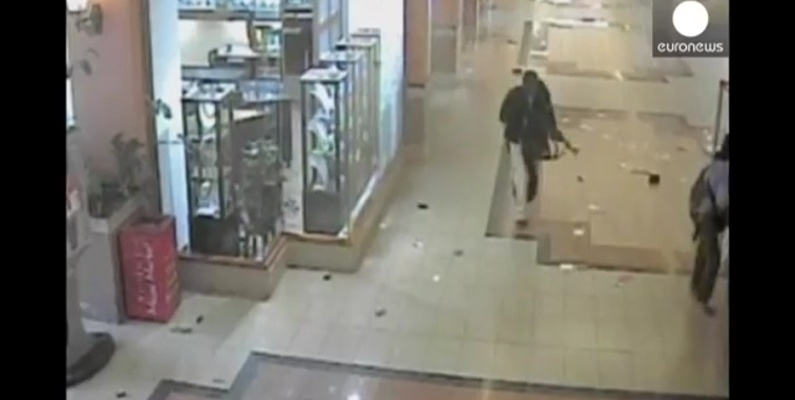

A Dataset of Guns in an Active state (When in use )

The Dataset contains over 1000 images annotated with two major classes, Human and Gun. These annotations were done using labelimg. The classes.txt contains a list of our classes. There are around 14 redundant classes which were not annotated for but were listed due to using labelimg default(First time using the tool). The All folder contains our images and our annotations in yolo format.

**Approach**

Although our image data is annotated in yolo format, I will like to build a faster rcnn model for detection. This will entail converting our data to pascal voc annotation format and using the pytorch faster rcnn model with a resnet backbone. I will also be creating a dataloader and performing some augumentations using albumentations on our image.

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

**1. Set up Libraries**

In [2]:
#Load Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import scipy
import cv2
import os
import glob
import time
import re
import random
import datetime
from PIL import Image, ImageDraw
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from shapely.geometry import Polygon, Point
import shutil
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.core.transforms_interface import ImageOnlyTransform

import torch
import torchvision
import torchmetrics
from torchmetrics.detection.mean_ap import MeanAveragePrecision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

In [3]:
img_path = '/kaggle/input/gun-detection/Gunmen Dataset/All'
img_list = glob.glob(os.path.join(img_path , "*.jpg"))
ann_list = glob.glob(os.path.join(img_path , "*.txt"))
print(len(img_list), len(ann_list))

1310 1310


**2.1 Visualise Some Images**

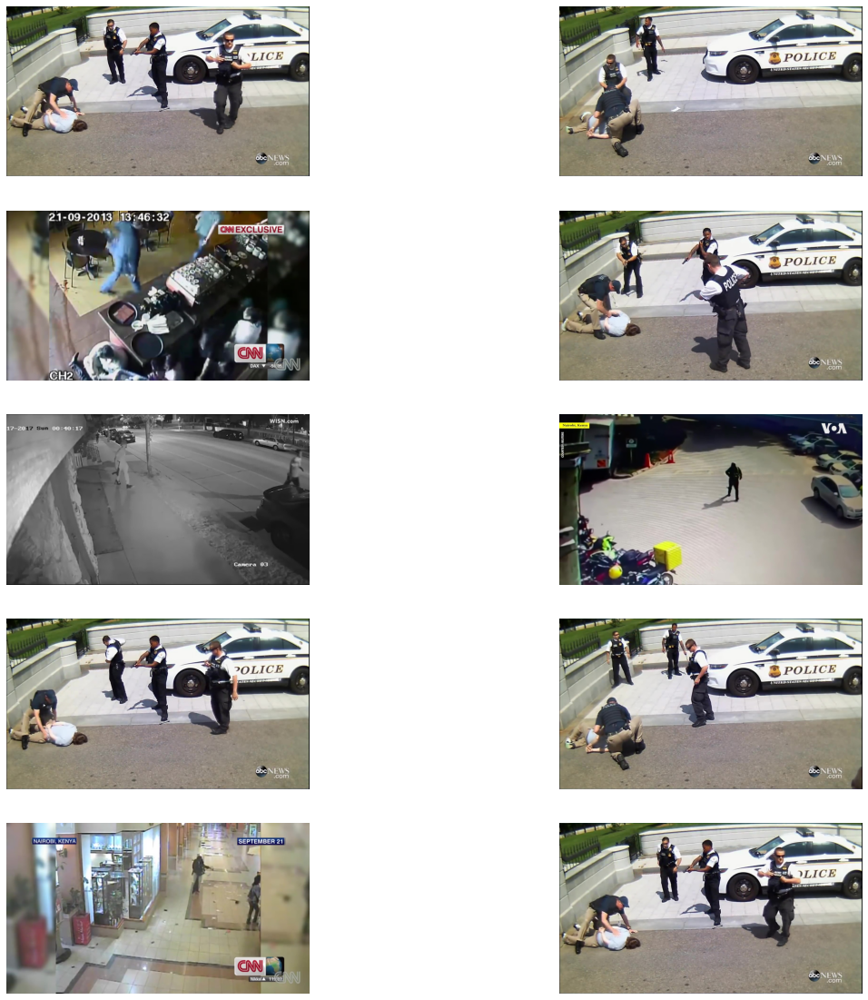

In [4]:
#plot some images 
plt.figure(figsize=(20,20))
for i, images in enumerate(img_list):
    if i > 9:
        break
    img = cv2.imread(images)
    RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img = Image.open(images)
    plt.subplot(5,2,i+1)
    plt.imshow(RGB_img)
    plt.axis('off')

**2.2 Visualizations With Bounding Boxes**

In [5]:
#Function to get image name
def imname(path):
    file = os.path.basename(path)
    file_name = file[:-4]
    return file_name

# function to get values to plot
def img_ann(imname):
    img = cv2.imread(f'/kaggle/input/gun-detection/Gunmen Dataset/All/{imname}.jpg')
    imr = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    df = pd.read_csv(f'/kaggle/input/gun-detection/Gunmen Dataset/All/{imname}.txt', sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])

    # rescale coordinates for visualization
    df_scaled = df.iloc[:, 1:]
    df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
    df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]
    return imr, df_scaled

#Function to plot images
def draw_annot(img, df):
    # create figure and axes
    fig,ax = plt.subplots(1, figsize=(15,15))
    # display the image
    ax.imshow(img)
    for box in df.values:
        # create a Rectangle patch
        rect = patches.Rectangle((box[0]-(box[2]/2),box[1]-(box[3]/2)),box[2],box[3],linewidth=3,edgecolor='g',facecolor='none')
    # add the patch to the axes
        ax.add_patch(rect)
    plt.axis('off')    
    plt.show()

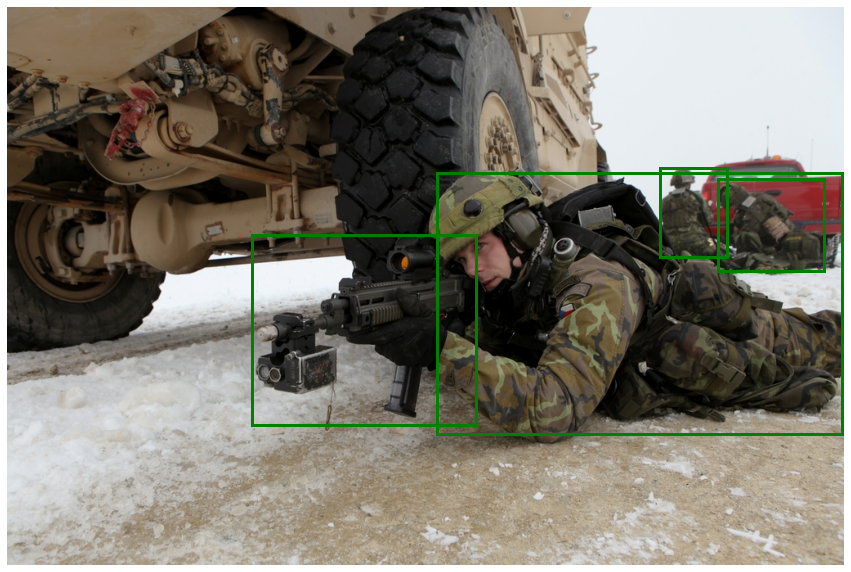

In [6]:
imgname = imname('/kaggle/input/gun-detection/Gunmen Dataset/All/02fb4ea38c03afae.txt')
img, df = img_ann(imgname)
# print(df)
draw_annot(img, df)

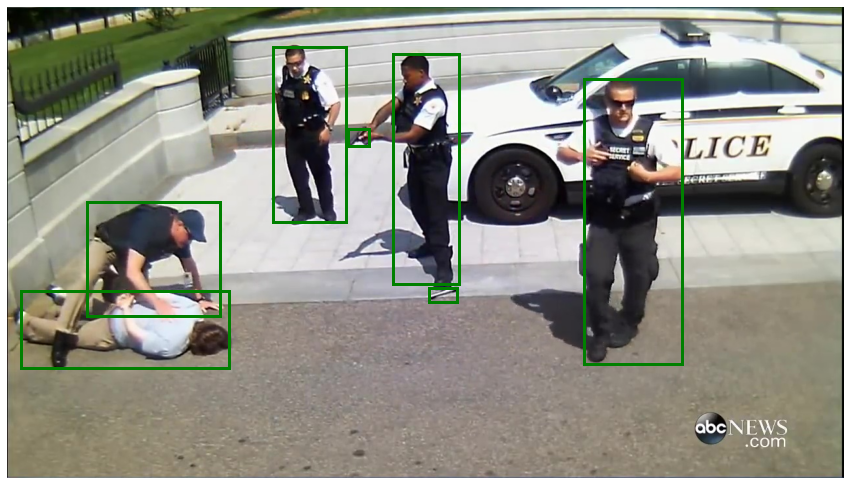

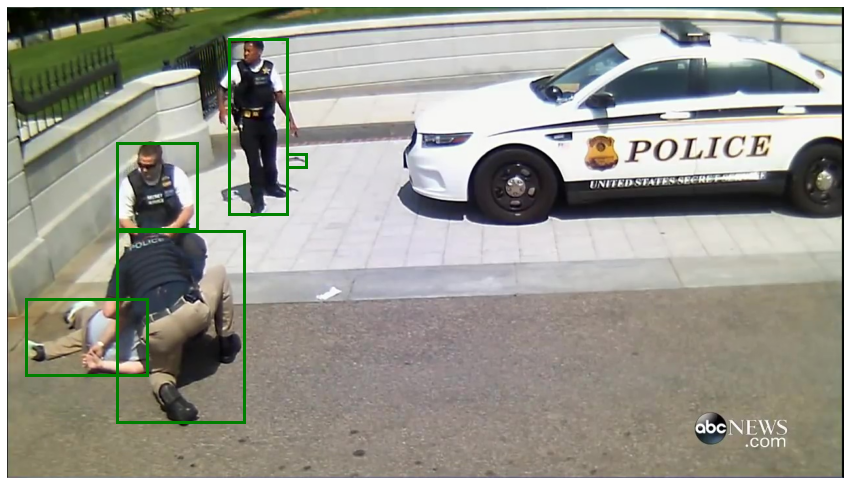

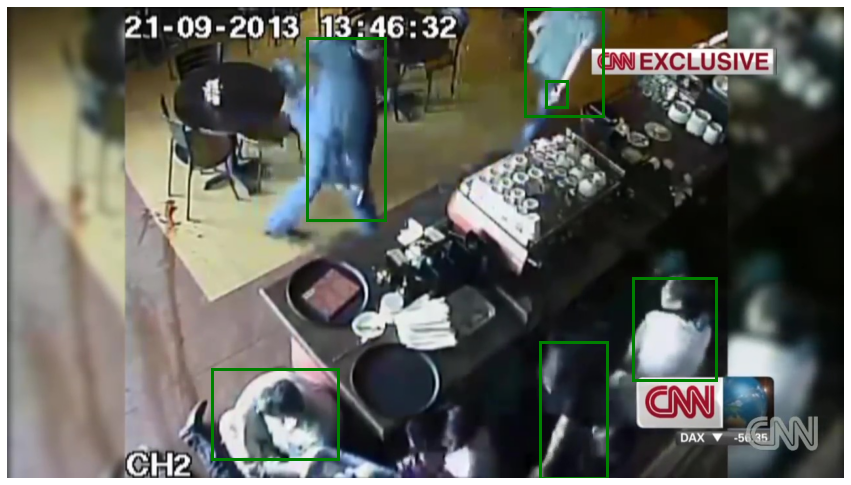

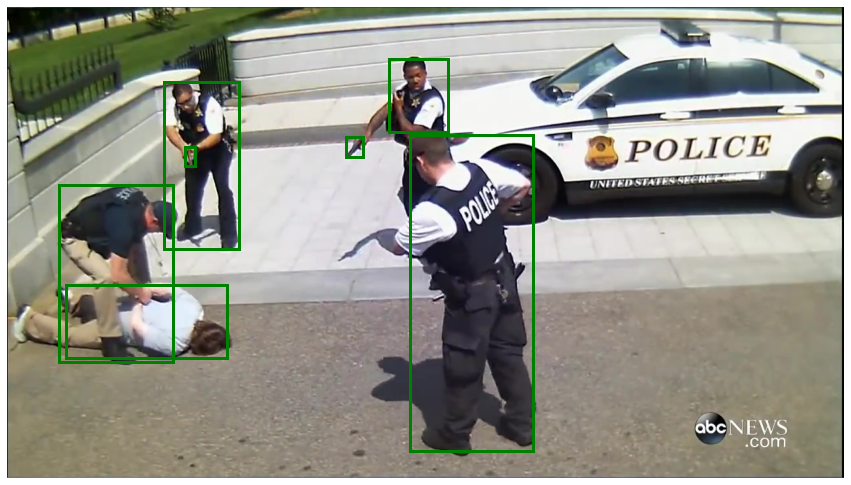

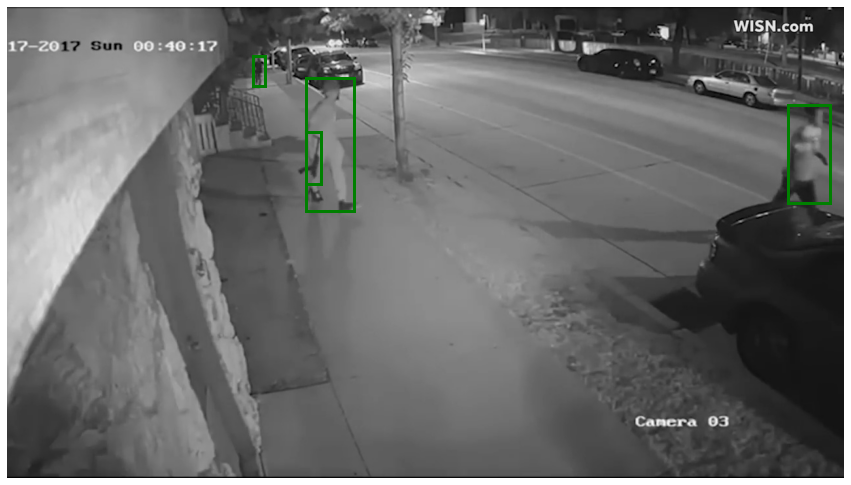

In [7]:
#Plot some images and their annotations
for i, images in enumerate(img_list):
    if i > 4:
        break
    imgname = imname(images)
    img, df = img_ann(imgname)
    draw_annot(img, df)    

**3.1 Data Preparation**

In [8]:
# making dirs to segregate images & annotations & also to save best trained model
os.makedirs('./annotations',exist_ok = True)
os.makedirs('./images', exist_ok = True)
os.makedirs('./test', exist_ok = True)
os.makedirs('./savedmodel', exist_ok = True)

In [9]:
trainval_list, test_list = train_test_split(img_list, test_size=0.05, shuffle=True)
print(len(trainval_list), len(test_list))

1244 66


In [10]:
#Get train and vallidation annotations list
trainval_ann_list = []
ann_path = '/kaggle/input/gun-detection/Gunmen Dataset/All'
for file in trainval_list:
    img_name = os.path.basename(file)
    file_name = img_name[:-4]
    ann_file = os.path.join(ann_path, file_name + '.txt')
    trainval_ann_list.append(ann_file)
    
len(trainval_ann_list)

1244

In [11]:
# Check for false files and remove if found
for file in trainval_ann_list:
    if os.path.exists(file)==False:
        print(file)
        trainval_ann_list.remove(file)
        
print(len(trainval_ann_list))

/kaggle/input/gun-detection/Gunmen Dataset/All/White House Shooting  Secret Service Shoot Gun-wielding Man [CAUGHT ON TAPE] (398).txt
1243


In [12]:
# Copy files from our img paths to our image folder in our working directory
def copy_files(filelist, dest):
    for file in filelist:
        shutil.copy(file, dest)
        
copy_files(trainval_list, './images')
copy_files(trainval_ann_list, './annotations')
copy_files(test_list, './test')

In [13]:
# Removing Image file with no annotations
annot_list_txt = glob.glob(os.path.join('/kaggle/working/annotations' , "*.txt"))
train_img_jpg = glob.glob(os.path.join('./images' , "*.jpg"))
for file in train_img_jpg:
    name = os.path.basename(file)
    ann_file_name = os.path.join('/kaggle/working/annotations', name[:-4] + '.txt')
    if os.path.exists(ann_file_name)==False:
        print(file)
        os.remove(file)
        print(f'{file} removed')

print(len(annot_list_txt))
print(len(train_img_jpg))

./images/White House Shooting  Secret Service Shoot Gun-wielding Man [CAUGHT ON TAPE] (398).jpg
./images/White House Shooting  Secret Service Shoot Gun-wielding Man [CAUGHT ON TAPE] (398).jpg removed
1243
1244


In [14]:
train_img_jpg = glob.glob(os.path.join('./images' , "*.jpg"))
print(len(train_img_jpg))
print(len(annot_list_txt))

1243
1243


**3.2 Convert Annotations to Pascal Voc**

In [ ]:
!pip install pylabel

In [16]:
#All annotations must have corresponding images to prevent errors when using our pylabel library
#A classes.txt file is present in our annotation file, so we removed it
# file_path = '/kaggle/working/annotations/classes.txt'
# print(os.path.exists(file_path))
# os.remove(file_path)
# print(os.path.exists(file_path))

In [ ]:
from pylabel import importer
#setting up paths
path_to_annotations = '/kaggle/working/annotations'
path_to_images = '/kaggle/working/images'

classes = ['dog','person','cat','tv','car','meatballs','marinara sauce','tomato soup','chicken noodle soup',
           'french onion soup','chicken breast','ribs','pulled pork','hamburger','cavity','Human','Gun']

dataset = importer.ImportYoloV5(path=path_to_annotations, path_to_images=path_to_images, cat_names=classes,
    img_ext="jpg", name="guns")

dataset.export.ExportToVoc('./annotations')

Number of images: 1243


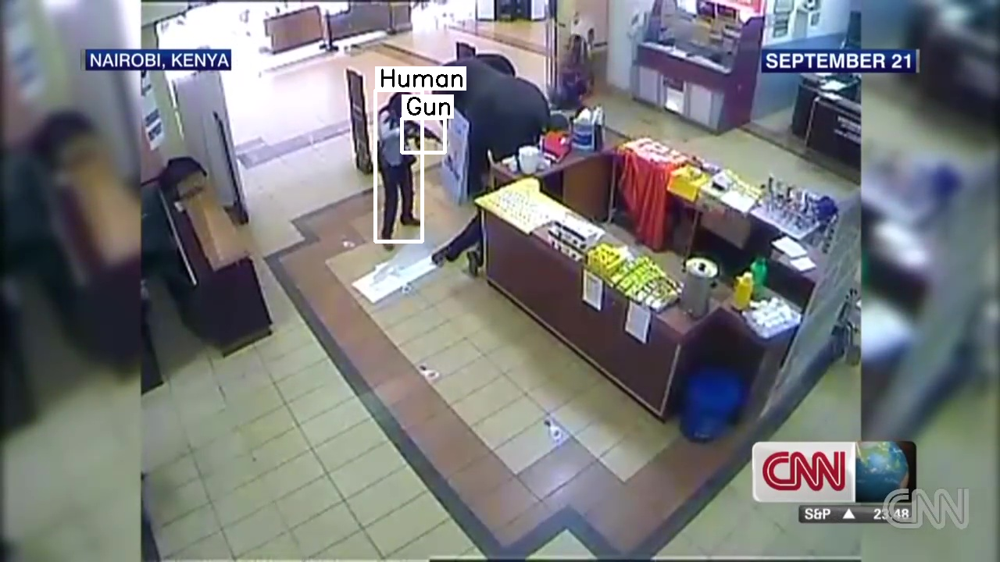

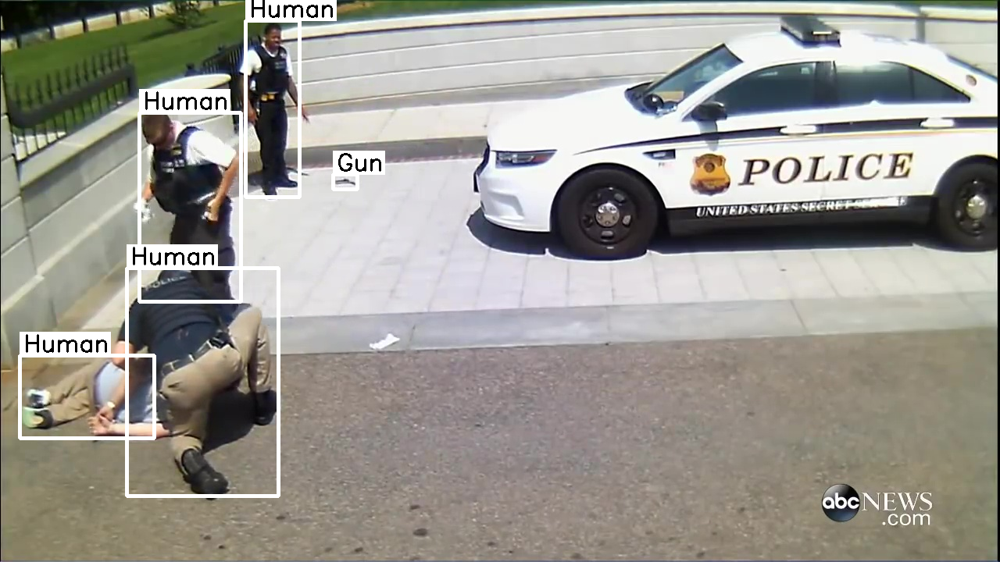

In [18]:
print(f"Number of images: {dataset.analyze.num_images}")
from IPython.display import Image, display
display(dataset.visualize.ShowBoundingBoxes(100))
display(dataset.visualize.ShowBoundingBoxes(40))

In [19]:
# !ls /kaggle/working/annotations

In [20]:
#Remove Images without annotations
#Just to double check
ann_list_xml = glob.glob(os.path.join('/kaggle/working/annotations' , "*.xml"))
img_list_jpg = glob.glob(os.path.join('/kaggle/working/images' , "*.jpg"))
print(len(ann_list_xml))
print(len(img_list_jpg))
for file in img_list_jpg:
    name = os.path.basename(file)
    ann_file_name = os.path.join('/kaggle/working/annotations', name[:-4] + '.xml')
    if os.path.exists(ann_file_name)==False:
        print(ann_file_name)
        os.remove(file)
        print(f'Removed {file}')
print(len(img_list_jpg))

1243
1243
1243


**3.3 Convert XML Annotations To DataFrame**

This step makes it easier to work with xml annotations when creating our dataloader class, creating cleaner code

In [21]:
# Extract info. from xml files
class XmlParser(object):

    def __init__(self,xml_file, IMG_PATH):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id 
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""
    
        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)


In [22]:
# Make dataframe from extracted information
def xml_files_to_df(xml_files, IMG_PATH):
    
    """"Return pandas dataframe from list of XML files."""
    
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file, IMG_PATH)
        names.extend(xml.names)
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}
    
    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()
    
    return df

img_path_jpg = '/kaggle/working/images'
df = xml_files_to_df(ann_list_xml, img_path_jpg)
df.head()

,image_id,names,boxes,xml_path,img_path
0,CNN has obtained videos from inside the Westga...,Human,"[566, 543, 734, 711]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...
1,CNN has obtained videos from inside the Westga...,Human,"[282, 367, 481, 716]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...
2,CNN has obtained videos from inside the Westga...,Gun,"[302, 516, 378, 662]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...
3,White House Shooting Secret Service Shoot Gun...,Gun,"[425, 225, 448, 238]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...
4,White House Shooting Secret Service Shoot Gun...,Human,"[438, 20, 514, 276]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...


Human    4363
Gun      1287
Name: names, dtype: int64


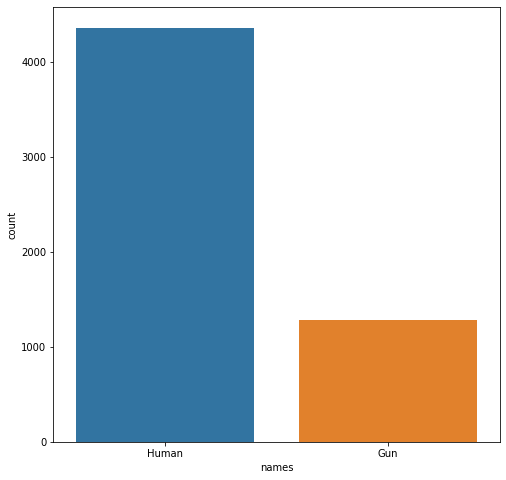

In [23]:
print(df['names'].value_counts())
plt.figure(figsize=(8,8))
sns.countplot(x='names', data=df)
plt.show()

In [24]:
# remove .jpg extension from image_id 
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
df.head()

,names,boxes,xml_path,img_path,img_id
0,Human,"[566, 543, 734, 711]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...
1,Human,"[282, 367, 481, 716]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...
2,Gun,"[302, 516, 378, 662]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...
3,Gun,"[425, 225, 448, 238]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...
4,Human,"[438, 20, 514, 276]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...


In [25]:
from sklearn import preprocessing
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
df['labels'] = np.stack(df['labels'][i]+1 for i in range(len(df['labels']))) 

classes = df[['names','labels']].value_counts()
classes

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3472: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


names  labels
Human  2         4363
Gun    1         1287
dtype: int64

In [26]:
df.head()

,names,boxes,xml_path,img_path,img_id,labels
0,Human,"[566, 543, 734, 711]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,2
1,Human,"[282, 367, 481, 716]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,2
2,Gun,"[302, 516, 378, 662]",/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,1
3,Gun,"[425, 225, 448, 238]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...,1
4,Human,"[438, 20, 514, 276]",/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...,2


In [27]:
classes= {0:'__background__', 1:'Gun', 2:'Human'} #Background classs is added for faster rcnn model

In [ ]:
# bounding box coordinates point need to be in separate columns

df['xmin'] = -1
df['ymin'] = -1
df['xmax'] = -1
df['ymax'] = -1

df[['xmin','ymin','xmax','ymax']]=np.stack(df['boxes'][i] for i in range(len(df['boxes'])))

df.drop(columns=['boxes'], inplace=True)
df['xmin'] = df['xmin'].astype(np.float64)
df['ymin'] = df['ymin'].astype(np.float64)
df['xmax'] = df['xmax'].astype(np.float64)
df['ymax'] = df['ymax'].astype(np.float64)

In [29]:
# drop names column since we dont need it anymore
df.drop(columns=['names'], inplace=True)
df.head()

,xml_path,img_path,img_id,labels,xmin,ymin,xmax,ymax
0,/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,2,566.0,543.0,734.0,711.0
1,/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,2,282.0,367.0,481.0,716.0
2,/kaggle/working/annotations/CNN has obtained v...,/kaggle/working/images/CNN has obtained videos...,CNN has obtained videos from inside the Westga...,1,302.0,516.0,378.0,662.0
3,/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...,1,425.0,225.0,448.0,238.0
4,/kaggle/working/annotations/White House Shooti...,/kaggle/working/images/White House Shooting S...,White House Shooting Secret Service Shoot Gun...,2,438.0,20.0,514.0,276.0


**4.1 Seperate Our Data Into Train and Validation**

In [30]:
print(df.shape)

(5650, 8)


In [31]:
train_df, val_df = train_test_split(df, test_size=0.2)
print(len(df['img_id'].unique()))
print(train_df.shape, val_df.shape)
print(len(val_df['img_id'].unique()))
print(len(train_df['img_id'].unique()))

type(train_df), type(val_df) 

1243
(4520, 8) (1130, 8)
716
1220


(pandas.core.frame.DataFrame, pandas.core.frame.DataFrame)

**4.2 Creating Data Class For Our Model**

In [32]:
class VOCDataset(Dataset):
    
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        
        self.image_ids = dataframe['img_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
    
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['img_id'] == image_id]
        
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        rows, cols = image.shape[:2]
        
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
        
       
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        label = records['labels'].values
        labels = torch.as_tensor(label, dtype=torch.int64)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1,0)
            
            return image, target
        
    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [33]:
#image and bounding box transforms
def get_transform_train():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
#         A.RandomBrightnessContrast(p=0.2),
#         A.Blur(blur_limit=3, p=0.1),
        ToTensorV2(p=1.0)
    ], bbox_params={'format':'pascal_voc', 'label_fields': ['labels']})

def get_transform_valid():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields':['labels']})

def collate_fn(batch):
    return tuple(zip(*batch))

In [34]:
IMG_DIR = './images'

train_dataset = VOCDataset(train_df, IMG_DIR , get_transform_train())
valid_dataset = VOCDataset(val_df, IMG_DIR, get_transform_valid())

train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

print(len(train_dataset))
print(len(valid_dataset))

1220
716


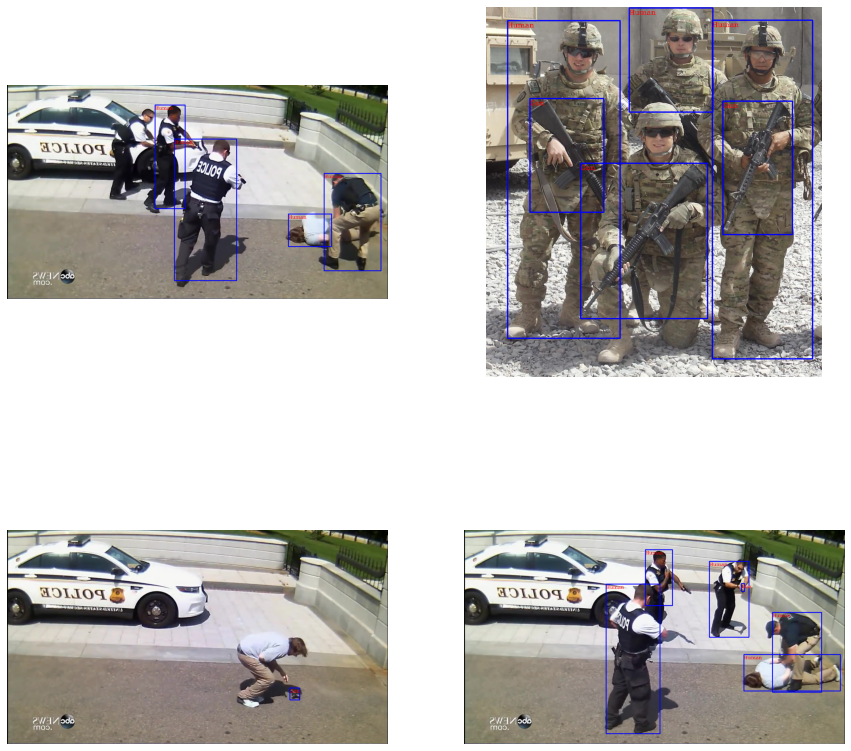

In [35]:
#plotting some images from our dataloader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
images, targets= next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

plt.figure(figsize=(15,15))
for i, (image, target) in enumerate(zip(images, targets)):
    plt.subplot(2,2, i+1)
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[i].permute(1,2,0).cpu().numpy()
    names = targets[i]['labels'].cpu().numpy().astype(np.int64)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 220), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]+15),cv2.FONT_HERSHEY_COMPLEX ,0.5,(255,0,0),1,cv2.LINE_AA)  
#     plt.subplots_adjust(pad=-5.0)
    plt.axis('off')
    plt.imshow(sample)

**5.1 Model Building**

In [ ]:
# load a faster rcnn model; pre-trained on COCO dataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 3  # Human + Gun + background

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [ ]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.1, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.1)

In [ ]:
# Training model on a single batch
model.train()
for images, targets in train_data_loader:
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    loss_dict = model(images, targets)
    losses = sum(loss for loss in loss_dict.values())
    print(losses.item())
    print(loss_dict)
    break

**5.2 Download Modules For Training**

In [ ]:
! pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [ ]:
! git clone https://github.com/pytorch/vision.git

In [39]:
! cd vision;cp references/detection/utils.py ../;cp references/detection/transforms.py ../;cp references/detection/coco_eval.py ../;cp references/detection/engine.py ../;cp references/detection/coco_utils.py ../

In [40]:
!ls

__notebook_source__.ipynb  coco_utils.py  savedmodel	 utils.py
annotations		   engine.py	  test		 vision
coco_eval.py		   images	  transforms.py


**5.3 Model Training**

In [ ]:
from engine import train_one_epoch, evaluate
import utils

# # let's train it for 3 epochs
num_epochs = 7

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=150)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, valid_data_loader, device=device)

In [ ]:
torch.save({
            'epoch': num_epochs,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, './savedmodel/10thepoch.pth')

In [ ]:
!ls /kaggle/working/savedmodel

**6.1 Model Inference**

In [43]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)
num_classes = 3
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

checkpoint = torch.load('/kaggle/input/202map-model/202map.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)

In [41]:
def obj_detector(img):
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


    img /= 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0,3,1,2)
    
    model.eval()

    detection_threshold = 0.50
    
    img = list(im.to(device) for im in img)
    output = model(img)

    for i , im in enumerate(img):
        boxes = output[i]['boxes'].data.cpu().numpy()
        scores = output[i]['scores'].data.cpu().numpy()
        labels = output[i]['labels'].data.cpu().numpy()

        labels = labels[scores >= detection_threshold]
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold]

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    
    sample = img[0].permute(1,2,0).cpu().numpy()
    sample = np.array(sample)
    boxes = output[0]['boxes'].data.cpu().numpy()
    name = output[0]['labels'].data.cpu().numpy()
    scores = output[0]['scores'].data.cpu().numpy()
    boxes = boxes[scores >= detection_threshold].astype(np.int32)
    names = name.tolist()
    
    return names, boxes, sample

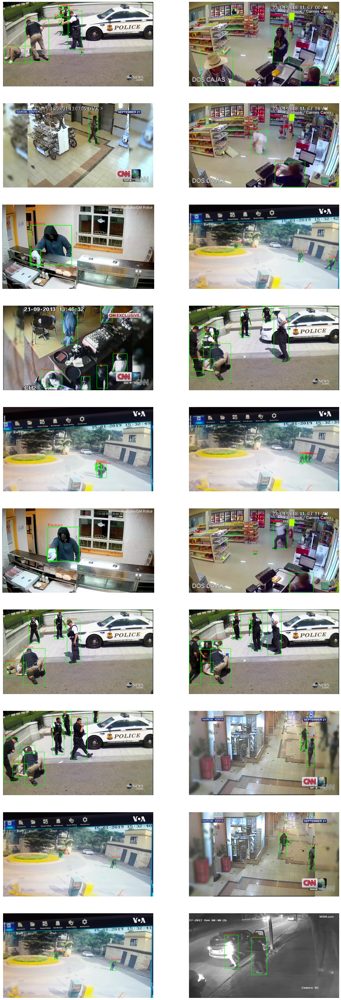

In [44]:
#Testing on Validation Images
pred_path = "/kaggle/working/test/"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i > 19:break
    plt.subplot(10,2,i+1)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)

**6.2 Model Tuning (Training More Epochs)**

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 3  # Human + Gun + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

params = [p for p in model.parameters() if p.requires_grad]
model.to(device)
optimizer = torch.optim.SGD(params, lr=0.1, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

In [ ]:
from engine import train_one_epoch, evaluate
import utils

# # let's train it for some epochs
num_epochs = 7

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=200)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, valid_data_loader, device=device)

In [ ]:
torch.save({
            'epoch': num_epochs,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, './savedmodel/135epoch.pth')

**Save Test Predictions**

In [52]:
os.makedirs('./prediction', exist_ok = True)
pred_path = "/kaggle/working/test/"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]
save_dir = '/kaggle/working/prediction'

def pred_results(files, savedir):
    classes= {0:'__background__', 1:'Gun', 2:'Human'}
    colors = [(255,0,0), (0,100,45), (0,0,255)]

    for i, images in enumerate(files):
        file_name = os.path.basename(images)
        path_name = os.path.join(savedir, file_name)
        names,boxes,sample = obj_detector(images)
        sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB) 
        for i,box in enumerate(boxes):
            cv2.rectangle(sample,
                          (box[0], box[1]),
                          (box[2], box[3]),
                          colors[names[i]], 2)
            cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.5,(255,0,0),1,cv2.LINE_AA)
        cv2.imwrite(path_name, sample*255)
        print(f'Saved {path_name}')

In [53]:
pred_results(pred_files, save_dir)

Saved /kaggle/working/prediction/White House Shooting  Secret Service Shoot Gun-wielding Man [CAUGHT ON TAPE] (56).jpg
Saved /kaggle/working/prediction/Moment mexican cowboy stopped armed robbery - BBC News (23).jpg
Saved /kaggle/working/prediction/CNN has obtained videos from inside the Westgate Mall (98).jpg
Saved /kaggle/working/prediction/Moment mexican cowboy stopped armed robbery - BBC News (80).jpg
Saved /kaggle/working/prediction/CCTV footage of an attempted robbery with camouflaged gun - Daily Mail (28).jpg
Saved /kaggle/working/prediction/Kenya Attack Security Footage Shows Al-Shabab Gunmen Entering Nairobi Hotel (72).jpg
Saved /kaggle/working/prediction/CNN has obtained videos from inside the Westgate Mall (201).jpg
Saved /kaggle/working/prediction/White House Shooting  Secret Service Shoot Gun-wielding Man [CAUGHT ON TAPE] (434).jpg
Saved /kaggle/working/prediction/Kenya Attack Security Footage Shows Al-Shabab Gunmen Entering Nairobi Hotel (95).jpg
Saved /kaggle/working/pre

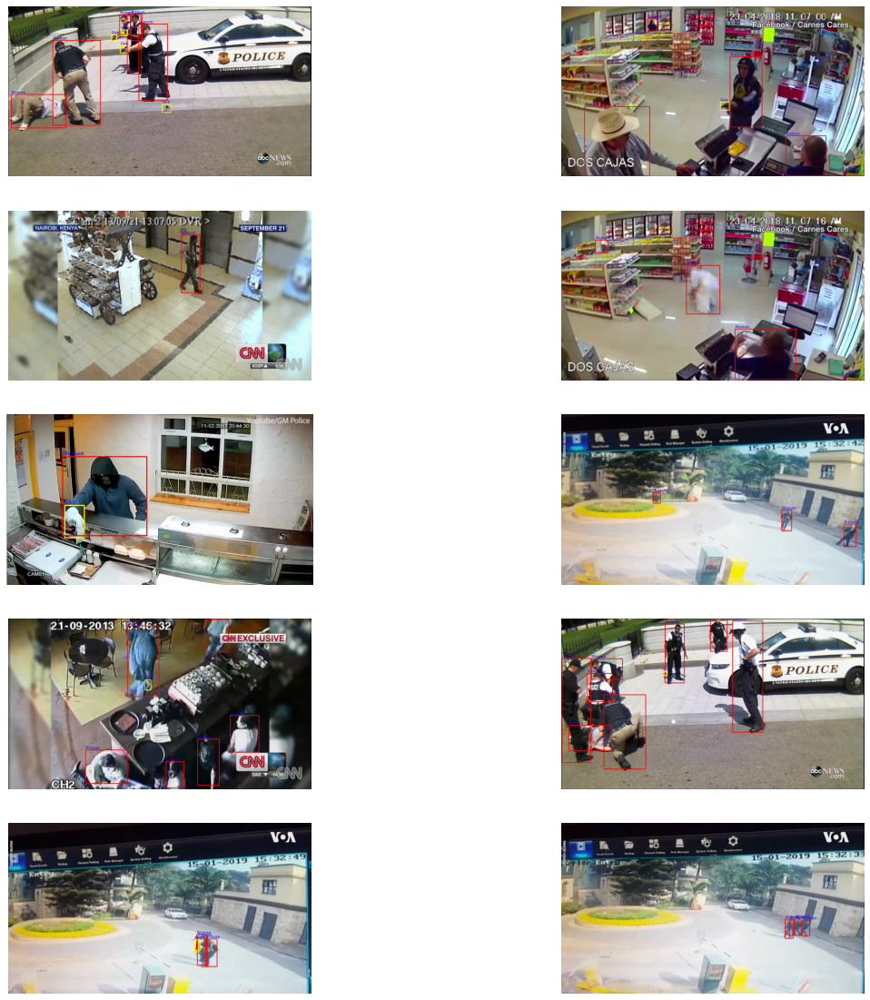

In [55]:
#plot some images
pred_img_path = '/kaggle/working/prediction'
pred_img_list = glob.glob(os.path.join(pred_img_path , "*.jpg"))
plt.figure(figsize=(20,20))
for i, images in enumerate(pred_img_list):
    if i > 9:
        break
    img = cv2.imread(images)
    RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(5,2,i+1)
    plt.imshow(RGB_img)
    plt.axis('off')

In [ ]:
!zip -r predfiles.zip /kaggle/working/prediction

In [ ]:
!ls /kaggle/working/prediction

In [ ]:
#empty cuda/gpu cache
import gc
torch.cuda.empty_cache()
gc.collect()